# Importing the libraries required

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

import datetime
import matplotlib.patches as mpatches

from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Working with dataset

# Reading the datasets

In [2]:
summary_cases = pd.read_csv("worldometer_coronavirus_summary_data.csv.xls")
daily_cases = pd.read_csv("worldometer_coronavirus_daily_data.csv")
vaccination = pd.read_csv("country_vaccinations.csv")

In [3]:
summary_cases.head()

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population
0,Afghanistan,Asia,88888,3460.0,60598.0,24830.0,1124.0,2236,87.0,520008.0,13081.0,39751424
1,Albania,Europe,132437,2453.0,129807.0,177.0,18.0,46068,853.0,752527.0,261764.0,2874828
2,Algeria,Africa,132727,3560.0,92384.0,36783.0,25.0,2976,80.0,230861.0,5177.0,44595470
3,Andorra,Europe,13813,127.0,13591.0,95.0,3.0,178504,1641.0,193595.0,2501809.0,77382
4,Angola,Africa,36455,819.0,30101.0,5535.0,9.0,1078,24.0,596451.0,17634.0,33823498


In [4]:
daily_cases.head()

,date,country,cumulative_total_cases,daily_new_cases,active_cases,cumulative_total_deaths,daily_new_deaths
0,2020-2-15,Afghanistan,0.0,NaN,0.0,0.0,NaN
1,2020-2-16,Afghanistan,0.0,NaN,0.0,0.0,NaN
2,2020-2-17,Afghanistan,0.0,NaN,0.0,0.0,NaN
3,2020-2-18,Afghanistan,0.0,NaN,0.0,0.0,NaN
4,2020-2-19,Afghanistan,0.0,NaN,0.0,0.0,NaN


In [5]:
vaccination.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,35.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


In [6]:
summary_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         220 non-null    object 
 1   continent                       220 non-null    object 
 2   total_confirmed                 220 non-null    int64  
 3   total_deaths                    206 non-null    float64
 4   total_recovered                 219 non-null    float64
 5   active_cases                    219 non-null    float64
 6   serious_or_critical             148 non-null    float64
 7   total_cases_per_1m_population   220 non-null    int64  
 8   total_deaths_per_1m_population  202 non-null    float64
 9   total_tests                     210 non-null    float64
 10  total_tests_per_1m_population   210 non-null    float64
 11  population                      220 non-null    int64  
dtypes: float64(7), int64(3), object(2)
m

In [7]:
daily_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106284 entries, 0 to 106283
Data columns (total 7 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   date                     106284 non-null  object 
 1   country                  106284 non-null  object 
 2   cumulative_total_cases   106284 non-null  float64
 3   daily_new_cases          99411 non-null   float64
 4   active_cases             105801 non-null  float64
 5   cumulative_total_deaths  99522 non-null   float64
 6   daily_new_deaths         85600 non-null   float64
dtypes: float64(5), object(2)
memory usage: 5.7+ MB


In [8]:
vaccination.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34463 entries, 0 to 34462
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              34463 non-null  object 
 1   iso_code                             34463 non-null  object 
 2   date                                 34463 non-null  object 
 3   total_vaccinations                   19149 non-null  float64
 4   people_vaccinated                    18269 non-null  float64
 5   people_fully_vaccinated              15448 non-null  float64
 6   daily_vaccinations_raw               15792 non-null  float64
 7   daily_vaccinations                   34198 non-null  float64
 8   total_vaccinations_per_hundred       19149 non-null  float64
 9   people_vaccinated_per_hundred        18269 non-null  float64
 10  people_fully_vaccinated_per_hundred  15448 non-null  float64
 11  daily_vaccinations_per_milli

# Checking for missing values

Text(0.5, 1.0, 'Missing values Covid daily')

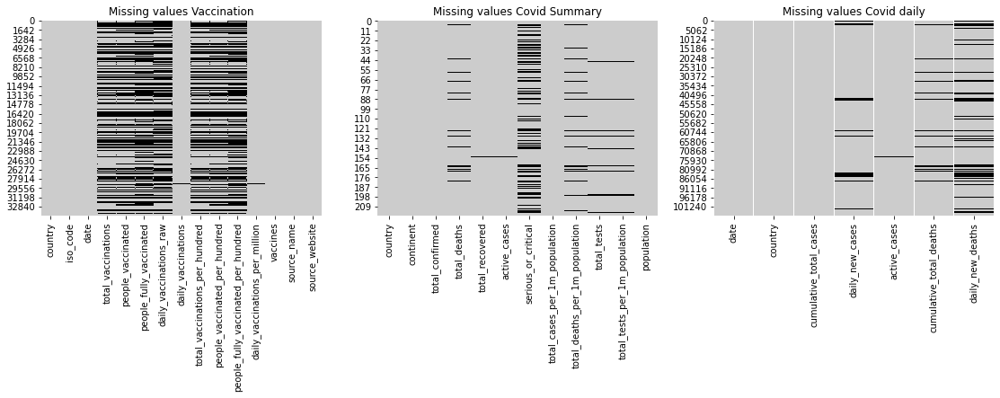

In [9]:
plt.figure(figsize=(19,4))
plt.subplot(1,3,1)
sns.heatmap(vaccination.isnull(),cbar=False,cmap='nipy_spectral_r')
plt.title("Missing values Vaccination")

plt.subplot(1,3,2)
sns.heatmap(summary_cases.isnull(),cbar=False,cmap='nipy_spectral_r')
plt.title("Missing values Covid Summary")

plt.subplot(1,3,3)
sns.heatmap(daily_cases.isnull(),cbar=False,cmap='nipy_spectral_r')
plt.title("Missing values Covid daily")




# So there are many null values present in the above 3 datasets

# Replacing these null values with 0

In [10]:
total = summary_cases.isnull().sum().sort_values(ascending=False)
percent=(summary_cases.isnull().sum()/summary_cases.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total,percent], axis=1,keys=['Total','Percent'])
missing_data

,Total,Percent
serious_or_critical,72,0.327273
total_deaths_per_1m_population,18,0.081818
total_deaths,14,0.063636
total_tests,10,0.045455
total_tests_per_1m_population,10,0.045455
total_recovered,1,0.004545
active_cases,1,0.004545
country,0,0.000000
continent,0,0.000000
total_confirmed,0,0.000000


In [11]:
summary_cases = summary_cases.replace(np.nan,0)

In [12]:
total=daily_cases.isnull().sum().sort_values(ascending=False)
percent = (daily_cases.isnull().sum()/daily_cases.isnull().count()).sort_values(ascending=False)
missing_data=pd.concat([total,percent],axis=1,keys=['Total','Percent'])
missing_data

,Total,Percent
daily_new_deaths,20684,0.194611
daily_new_cases,6873,0.064666
cumulative_total_deaths,6762,0.063622
active_cases,483,0.004544
date,0,0.000000
country,0,0.000000
cumulative_total_cases,0,0.000000


In [13]:
daily_cases = daily_cases.replace(np.nan,0)

In [14]:
total=daily_cases.isnull().sum().sort_values(ascending=False)
percent = (vaccination.isnull().sum()/daily_cases.isnull().count()).sort_values(ascending=False)
missing_data=pd.concat([total,percent],axis=1,keys=['Total','Percent'])
missing_data

,Total,Percent
date,0.0,0.0
country,0.0,0.0
cumulative_total_cases,0.0,NaN
daily_new_cases,0.0,NaN
active_cases,0.0,NaN
cumulative_total_deaths,0.0,NaN
daily_new_deaths,0.0,NaN
daily_vaccinations,NaN,NaN
daily_vaccinations_per_million,NaN,NaN
daily_vaccinations_raw,NaN,NaN


In [15]:
vaccination = vaccination.replace(np.nan,0)

Now there are no null values left

# Combining the above dataframes into single dataframe

In [16]:
#function to easily agrregate columns
def aggregate(df: pd.Series,agg_col:str)->pd.DataFrame:
    
    data = df.groupby("country")[agg_col].max()
    data = pd.DataFrame(data)
    
    return data

In [17]:
#define the columns we want to summarize

clos_to_summarize = ['people_vaccinated',
                    'people_vaccinated_per_hundred',
                    'people_fully_vaccinated',
                    'people_fully_vaccinated_per_hundred',
                    'total_vaccinations_per_hundred',
                    'total_vaccinations']
cols = ['daily_new_cases','daily_new_deaths']

summary = summary_cases.set_index("country")
vaccines = vaccination[['country','vaccines']].drop_duplicates().set_index('country')

for col in clos_to_summarize:
    summary = summary.join(aggregate(vaccination,col))

for col in cols:
    summary = summary.join(aggregate(daily_cases,col))

summary['percentage_vaccinated'] = summary.total_vaccinations / summary.population*100
summary['tested_positive'] = summary.total_confirmed / summary.total_tests*100


In [18]:
summary.reset_index(level=0, inplace=True)

In [19]:
summary.head()

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,...,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,daily_new_cases,daily_new_deaths,percentage_vaccinated,tested_positive
0,Afghanistan,Asia,88888,3460.0,60598.0,24830.0,1124.0,2236,87.0,520008.0,...,763020.0,1.96,219159.0,0.56,3.55,1381416.0,1842.0,56.0,3.475136,17.093583
1,Albania,Europe,132437,2453.0,129807.0,177.0,18.0,46068,853.0,752527.0,...,665632.0,23.13,525215.0,18.25,41.38,1190847.0,1239.0,21.0,41.423243,17.598970
2,Algeria,Africa,132727,3560.0,92384.0,36783.0,25.0,2976,80.0,230861.0,...,3421279.0,7.80,724812.0,1.65,7.80,3421279.0,1133.0,30.0,7.671808,57.492171
3,Andorra,Europe,13813,127.0,13591.0,95.0,3.0,178504,1641.0,193595.0,...,48445.0,62.70,33904.0,43.88,106.58,82349.0,299.0,6.0,106.418805,7.134998
4,Angola,Africa,36455,819.0,30101.0,5535.0,9.0,1078,24.0,596451.0,...,958373.0,2.92,634164.0,1.93,4.85,1592537.0,405.0,18.0,4.708375,6.111986


# Dropping unwanted columns

In [20]:
summary=summary.drop(['serious_or_critical','total_cases_per_1m_population','total_deaths_per_1m_population','total_tests_per_1m_population'],axis=1)

In [21]:
summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   continent                            220 non-null    object 
 2   total_confirmed                      220 non-null    int64  
 3   total_deaths                         220 non-null    float64
 4   total_recovered                      220 non-null    float64
 5   active_cases                         220 non-null    float64
 6   total_tests                          220 non-null    float64
 7   population                           220 non-null    int64  
 8   people_vaccinated                    177 non-null    float64
 9   people_vaccinated_per_hundred        177 non-null    float64
 10  people_fully_vaccinated              177 non-null    float64
 11  people_fully_vaccinated_per_hund

# Visualisations

# Correlation of Data

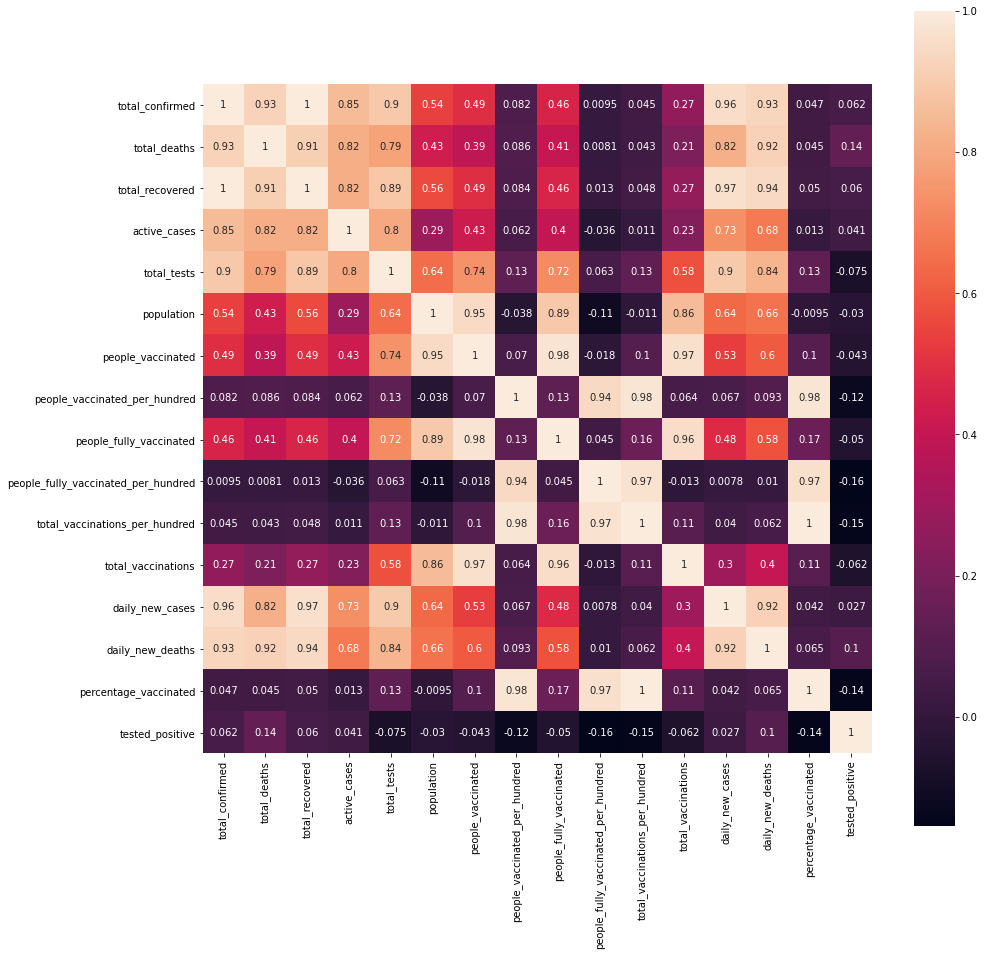

In [22]:
data = summary.reset_index().dropna(subset=['country'])
plt.subplots(figsize=(15,15))
sns.heatmap(summary.corr(),annot=True,square=True)
plt.show()

# Confirmed cases for Top 20 Countries

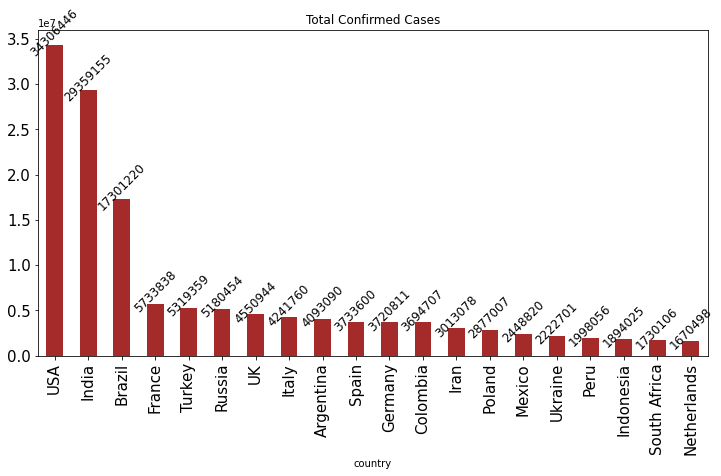

In [23]:
top20 = summary.groupby('country')['total_confirmed'].max().sort_values(ascending = False).head(20)
splot=top20.plot(x='country',y=['total_confirmed'],kind ="bar",figsize=(12,6),color="brown",title="Total Confirmed Cases")
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Active Cases for Top 20 Countries

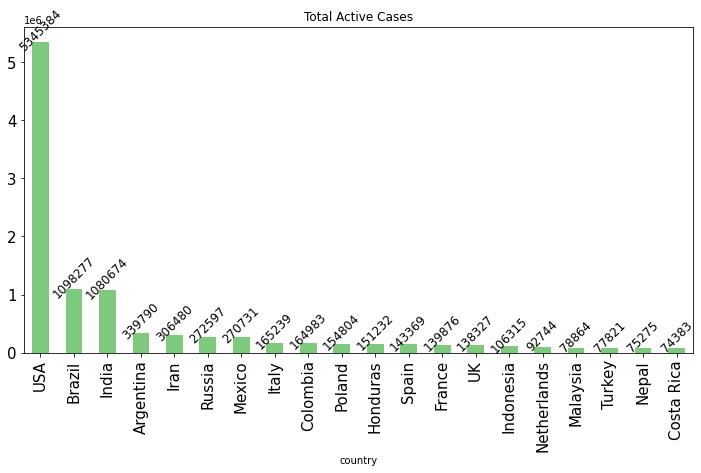

In [24]:
top20 = summary.groupby('country')['active_cases'].max().sort_values(ascending = False).head(20)
splot=top20.plot(x='country',y=['active_cases'],kind ="bar",figsize=(12,6),colormap="Accent",title="Total Active Cases")
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Total Deaths for Top 20 countries

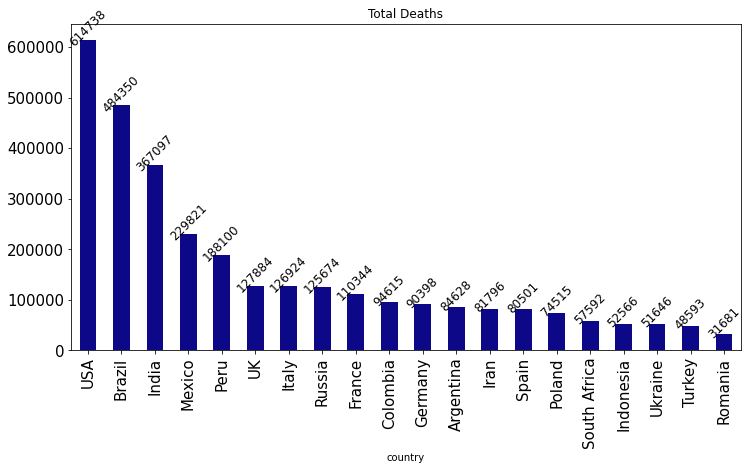

In [25]:
top20 = summary.groupby('country')['total_deaths'].max().sort_values(ascending = False).head(20)
splot=top20.plot(x='country',y=['total_deaths'],kind ="bar",figsize=(12,6),colormap="plasma",title="Total Deaths")
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Death Rate WorldWide

In [26]:
title="Death Summary"
death=summary.copy()
death['death_rate'] = death['total_deaths']*100/death['total_confirmed']
death = death.dropna(subset=['death_rate'])
fig = px.scatter_geo(death,locations="country",color="continent",
                    locationmode='country names',
                    hover_name="country",size="death_rate",
                    projection="natural earth")
fig.update_layout(title=title, title_x=0.45)
fig.show()

# Total Recovered for Top 20 countries

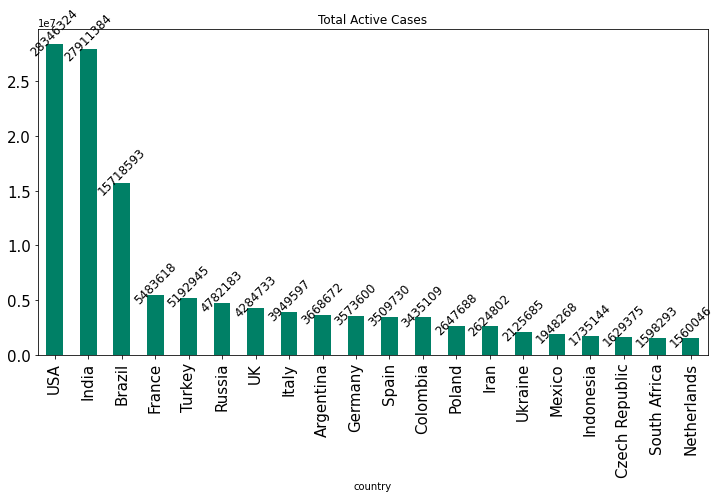

In [27]:
top20 = summary.groupby('country')['total_recovered'].max().sort_values(ascending = False).head(20)
splot=top20.plot(x='country',y=['total_recovered'],kind ="bar",figsize=(12,6),colormap="summer",title="Total Active Cases")
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Comparing Total confirmed with Total Recovered for Top 20 sorted based on Total_confirmed cases

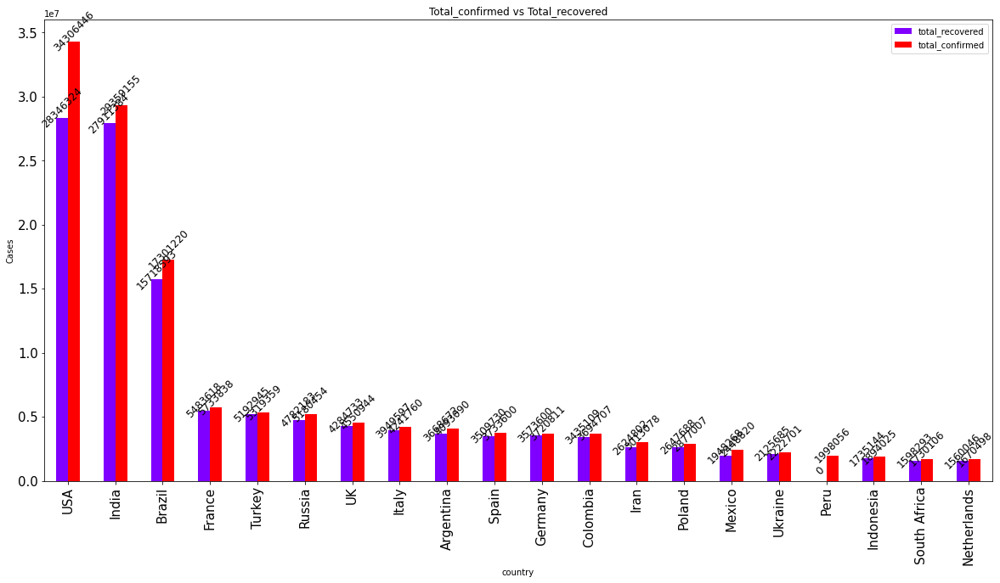

In [28]:
top20=summary.sort_values('total_confirmed',ascending=False).head(20)
splot=top20.plot(x='country', y=['total_recovered','total_confirmed'],kind="bar",figsize=(20,10),
          ylabel="Cases", title="Total_confirmed vs Total_recovered", colormap='rainbow')
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Comparing Total Recovered with the Active Cases for Top 10 sorted on Total_recovered cases

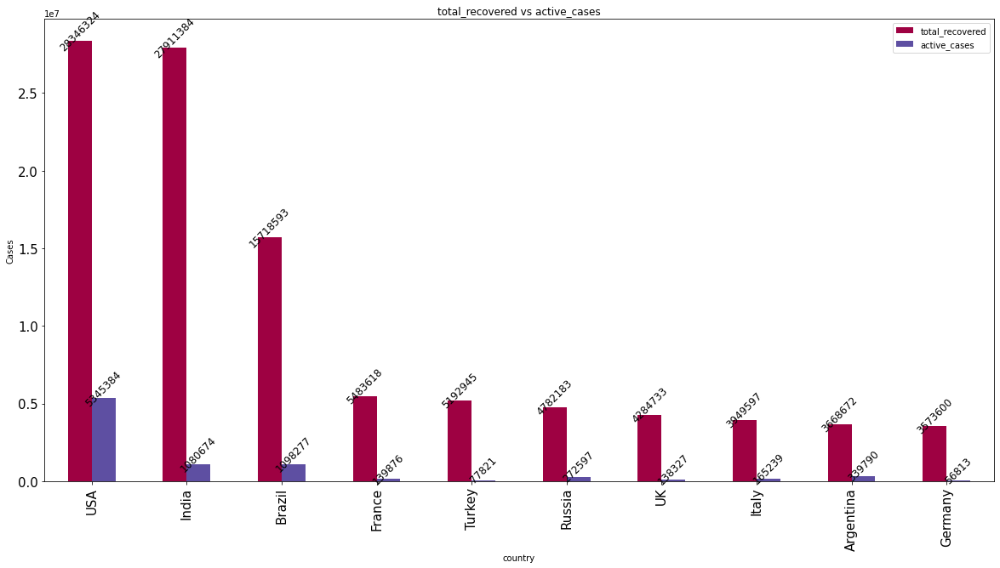

In [29]:
top20=summary.sort_values('total_recovered',ascending=False).head(10)
splot=top20.plot(x='country', y=['total_recovered','active_cases'],kind="bar",figsize=(20,10),
          ylabel="Cases", title="total_recovered vs active_cases", colormap='Spectral')
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)

for p in splot.patches:
    splot.annotate(format(p.get_height(),'.0f'),(p.get_x()+p.get_width()/2.,p.get_height()),ha='center',va='center',size=12,xytext=(0,12),textcoords='offset points',rotation=45)

# Bar and line plots for Daily Rise in Cases

In [30]:
rise = pd.DataFrame(daily_cases.groupby('date')['daily_new_cases'].sum())
rise = rise.reset_index()
fig = px.bar(rise,x='date', y='daily_new_cases',width=700,height=400)
fig.show()

In [31]:
fig=px.line(daily_cases,x="date",y="daily_new_cases",color='country',title="Daily rise in cases")
fig.show()

# Highest Number of People vaccinated(Fully & one dose) countrywise for Top 20 Countries

In [32]:
fully=summary.groupby('country')['people_vaccinated','people_fully_vaccinated'].max().sort_values(by='people_vaccinated',ascending=False).head(30)
fully['total'] = fully['people_vaccinated'] + fully['people_fully_vaccinated']
fully

,people_vaccinated,people_fully_vaccinated,total
country,,,
China,622000000.0,223299000.0,845299000.0
India,359820313.0,101698166.0,461518479.0
Brazil,105057816.0,41489804.0,146547620.0
Germany,51241053.0,43213380.0,94454433.0
Japan,48862145.0,35147293.0,84009438.0
Indonesia,47226514.0,20534823.0,67761337.0
Mexico,46866125.0,25727786.0,72593911.0
France,41673008.0,31841857.0,73514865.0
Turkey,41012715.0,27355633.0,68368348.0


In [33]:
fully.reset_index(level=0,inplace=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 [Text(0, 0, 'China'),
  Text(1, 0, 'India'),
  Text(2, 0, 'Brazil'),
  Text(3, 0, 'Germany'),
  Text(4, 0, 'Japan'),
  Text(5, 0, 'Indonesia'),
  Text(6, 0, 'Mexico'),
  Text(7, 0, 'France'),
  Text(8, 0, 'Turkey'),
  Text(9, 0, 'Italy'),
  Text(10, 0, 'Russia'),
  Text(11, 0, 'Spain'),
  Text(12, 0, 'Canada'),
  Text(13, 0, 'Argentina'),
  Text(14, 0, 'South Korea'),
  Text(15, 0, 'Saudi Arabia'),
  Text(16, 0, 'Poland'),
  Text(17, 0, 'Colombia'),
  Text(18, 0, 'Malaysia'),
  Text(19, 0, 'Chile'),
  Text(20, 0, 'Morocco'),
  Text(21, 0, 'Thailand'),
  Text(22, 0, 'Netherlands'),
  Text(23, 0, 'Philippines'),
  Text(24, 0, 'Sri Lanka'),
  Text(25, 0, 'Pakistan'),
  Text(26, 0, 'Ecuador'),
  Text(27, 0, 'Bangladesh'),
  Text(28, 0, 'Australia'),
  Text(29, 0, 'Belgium')])

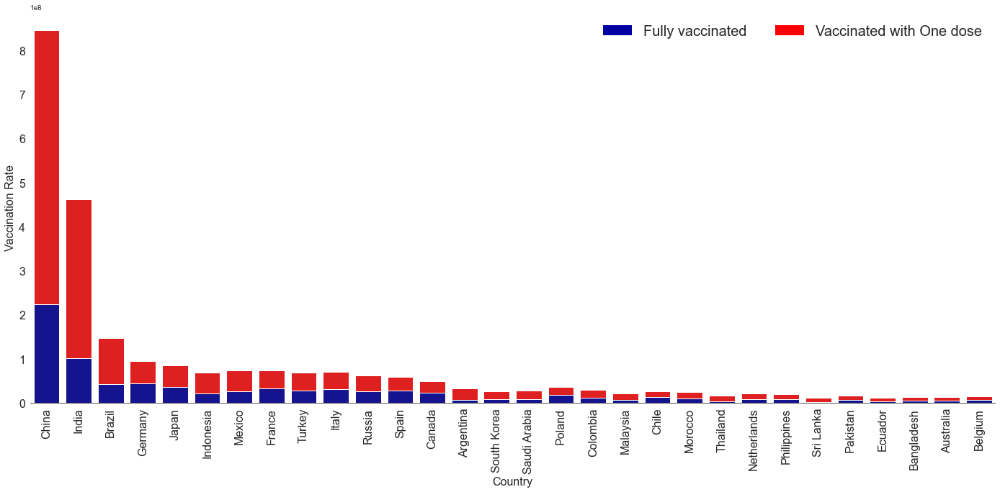

In [34]:
sns.set_style("white")
sns.set_context({"figure.figsize":(24,10)})
sns.barplot(x=fully['country'],y=fully['total'], color="red")

bottom_plot = sns.barplot(x=fully['country'],y=fully['people_fully_vaccinated'], color='#0000A3')

topbar = plt.Rectangle((0,0),1,1,fc="red",edgecolor='none')
bottombar = plt.Rectangle((0,0),1,1,fc='#0000A3',edgecolor='none')
l = plt.legend([bottombar,topbar],['Fully vaccinated','Vaccinated with One dose'], loc=1,ncol=2,prop={'size':20})
l.draw_frame(False)

sns.despine(left=True)
bottom_plot.set_ylabel("Vaccination Rate")
bottom_plot.set_xlabel("Country")

for item in ([bottom_plot.xaxis.label,bottom_plot.yaxis.label] + 
             bottom_plot.get_xticklabels() + bottom_plot.get_yticklabels()):
    item.set_fontsize(16)
plt.xticks(rotation=90)

# Percentage of people full vaccinated and people vaccinated for only one dose

# Here percentage is calculated using overall population of country i.e number of vaccinations/ total population of country

In [35]:
summary['per_one_dose']=summary.people_vaccinated/summary.population*100
summary['full_vaccinated']=summary.people_fully_vaccinated/summary.population*100
summary


,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,total_tests,population,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,daily_new_cases,daily_new_deaths,percentage_vaccinated,tested_positive,per_one_dose,full_vaccinated
0,Afghanistan,Asia,88888,3460.0,60598.0,24830.0,520008.0,39751424,763020.0,1.96,219159.0,0.56,3.55,1381416.0,1842.0,56.0,3.475136,17.093583,1.919478,0.551324
1,Albania,Europe,132437,2453.0,129807.0,177.0,752527.0,2874828,665632.0,23.13,525215.0,18.25,41.38,1190847.0,1239.0,21.0,41.423243,17.598970,23.153803,18.269441
2,Algeria,Africa,132727,3560.0,92384.0,36783.0,230861.0,44595470,3421279.0,7.80,724812.0,1.65,7.80,3421279.0,1133.0,30.0,7.671808,57.492171,7.671808,1.625304
3,Andorra,Europe,13813,127.0,13591.0,95.0,193595.0,77382,48445.0,62.70,33904.0,43.88,106.58,82349.0,299.0,6.0,106.418805,7.134998,62.604999,43.813807
4,Angola,Africa,36455,819.0,30101.0,5535.0,596451.0,33823498,958373.0,2.92,634164.0,1.93,4.85,1592537.0,405.0,18.0,4.708375,6.111986,2.833453,1.874921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Wallis And Futuna Islands,Australia/Oceania,445,7.0,438.0,0.0,20508.0,11052,NaN,NaN,NaN,NaN,NaN,NaN,63.0,2.0,NaN,2.169885,NaN,NaN
216,Western Sahara,Africa,10,1.0,8.0,1.0,0.0,611118,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0,NaN,inf,NaN,NaN
217,Yemen,Asia,6856,1342.0,3697.0,1817.0,78099.0,30442770,298161.0,1.00,13322.0,0.04,1.04,311483.0,174.0,52.0,1.023176,8.778602,0.979415,0.043761
218,Zambia,Africa,107974,1348.0,95674.0,10952.0,1670458.0,18866484,284700.0,1.55,149016.0,0.81,2.36,433716.0,2146.0,32.0,2.298870,6.463736,1.509025,0.789845


In [36]:
full = summary.groupby('country')['full_vaccinated'].max().sort_values(ascending=False).head(50)
one_dose = summary.groupby('country')['per_one_dose'].max().sort_values(ascending=False).head(50)

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

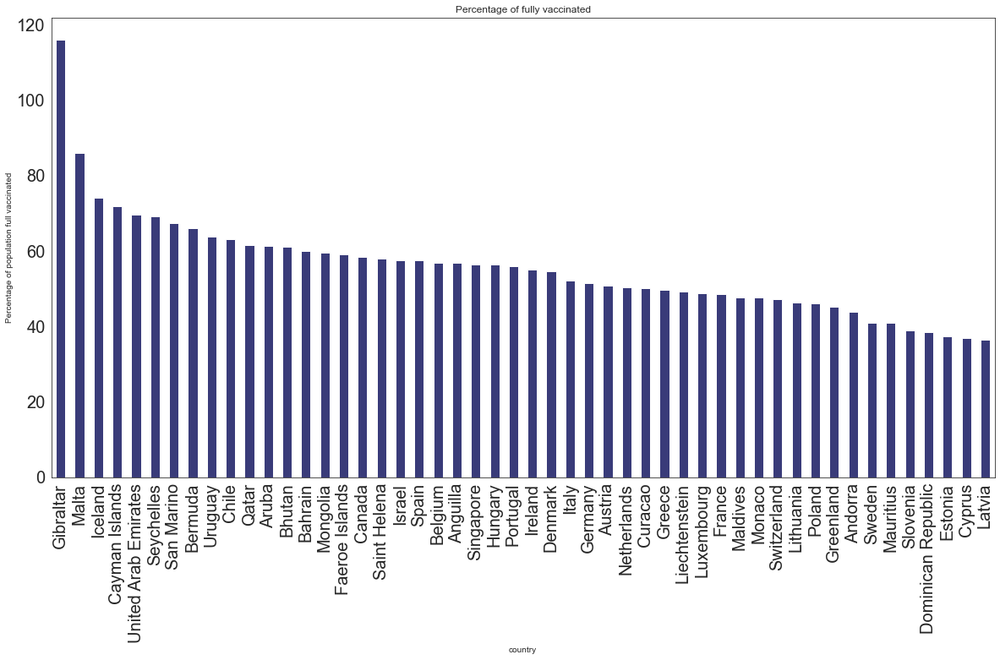

In [37]:
full.plot(x='country',y=['full'],kind="bar",figsize=(20,10),ylabel="Percentage of population full vaccinated",
         title="Percentage of fully vaccinated",colormap='tab20b')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

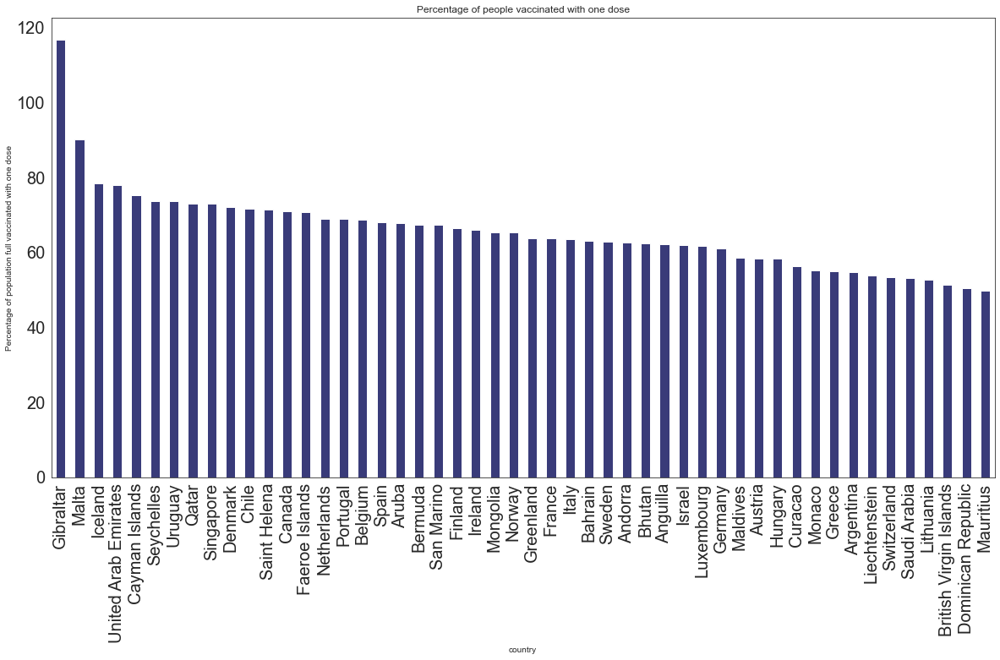

In [38]:
one_dose .plot(x='country',kind="bar",figsize=(20,10),ylabel="Percentage of population full vaccinated with one dose",
         title="Percentage of people vaccinated with one dose",colormap='tab20b')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

# Vaccine brands used

In [39]:
pd.DataFrame(vaccination.groupby("country")[["vaccines"]].max()).head(10)

,vaccines
country,
Afghanistan,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi..."
Albania,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ..."
Algeria,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac..."
Andorra,"Oxford/AstraZeneca, Pfizer/BioNTech"
Angola,Oxford/AstraZeneca
Anguilla,Oxford/AstraZeneca
Antigua and Barbuda,Oxford/AstraZeneca
Argentina,"Oxford/AstraZeneca, Sinopharm/Beijing, Sputnik V"
Armenia,"Oxford/AstraZeneca, Sinovac, Sputnik V"


In [40]:
daily = vaccination.loc[:,['country','date','vaccines','daily_vaccinations']].dropna(subset=['daily_vaccinations'])
daily["date"] = pd.to_datetime(daily["date"],format='%Y-%m-%d')

daily_agg = daily.groupby('country').daily_vaccinations.agg(
        sum_vaccination_amt='sum',
        mean_vaccination_amt='mean')

full_daily = daily.merge(daily_agg, on='country')
full_daily.head()

,country,date,vaccines,daily_vaccinations,sum_vaccination_amt,mean_vaccination_amt
0,Afghanistan,2021-02-22,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",0.0,1256269.0,7951.06962
1,Afghanistan,2021-02-23,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",1367.0,1256269.0,7951.06962
2,Afghanistan,2021-02-24,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",1367.0,1256269.0,7951.06962
3,Afghanistan,2021-02-25,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",1367.0,1256269.0,7951.06962
4,Afghanistan,2021-02-26,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",1367.0,1256269.0,7951.06962


In [41]:
vaccines = vaccination.loc[:,['country','vaccines']]
vaccines = vaccines.groupby('vaccines')['country'].unique()
vaccines = pd.DataFrame(vaccines).reset_index()
vaccines

,vaccines,country
0,"Abdala, Soberana02",[Cuba]
1,"CanSino, Johnson&Johnson, Oxford/AstraZeneca, ...",[Mexico]
2,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[Chile]
3,"CanSino, Oxford/AstraZeneca, Sinopharm/Beijing...",[Pakistan]
4,"CanSino, Sinopharm/Beijing, Sinopharm/Wuhan, S...",[China]
5,"Covaxin, Oxford/AstraZeneca",[Central African Republic]
6,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing","[Comoros, Mauritius]"
7,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[Paraguay]
8,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[Iran]
9,"Covaxin, Oxford/AstraZeneca, Sputnik V",[India]


In [42]:
title = "Popular Vaccines"
data = full_daily
fig = px.choropleth(data,
                   locations="country",
                   locationmode='country names',
                   color="vaccines",
                   hover_name="country",
                       )

fig.update_layout(title=title,
                 title_x=0.5,
                 legend_orientation='h'
)
fig.show()

# Analysis for India

# Active Cases and Daily new deaths

In [43]:
india = daily_cases[daily_cases['country']=='India']
fig = make_subplots(rows=2,cols=1,subplot_titles=('Active Cases','Daily New Deaths'))

fig.add_trace(go.Bar(x=india['date'].values, y=india['active_cases'].values,showlegend=False),
              row=1,col=1)

fig.add_trace(go.Bar(x=india['date'].values, y=india['daily_new_deaths'].values,showlegend=False),
              row=2,col=1)

fig.update_layout(height=800,width=700)
fig.show()


# Daily Vaccinations

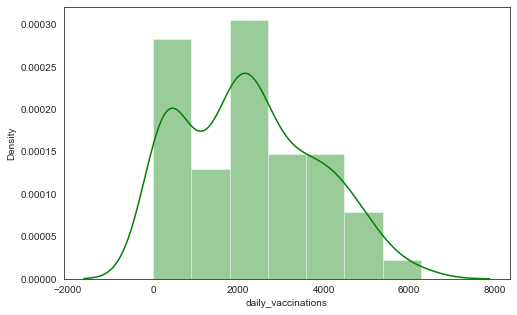

In [44]:
df = vaccination[vaccination['country']=='India']
plt.figure(figsize=(8,5))

sns.distplot(df.daily_vaccinations/1000,kde=True,color='green')
plt.xlabel=('Daily Vaccinations(x1000)')

Text(0.5, 1.0, 'Daily Vaccination')

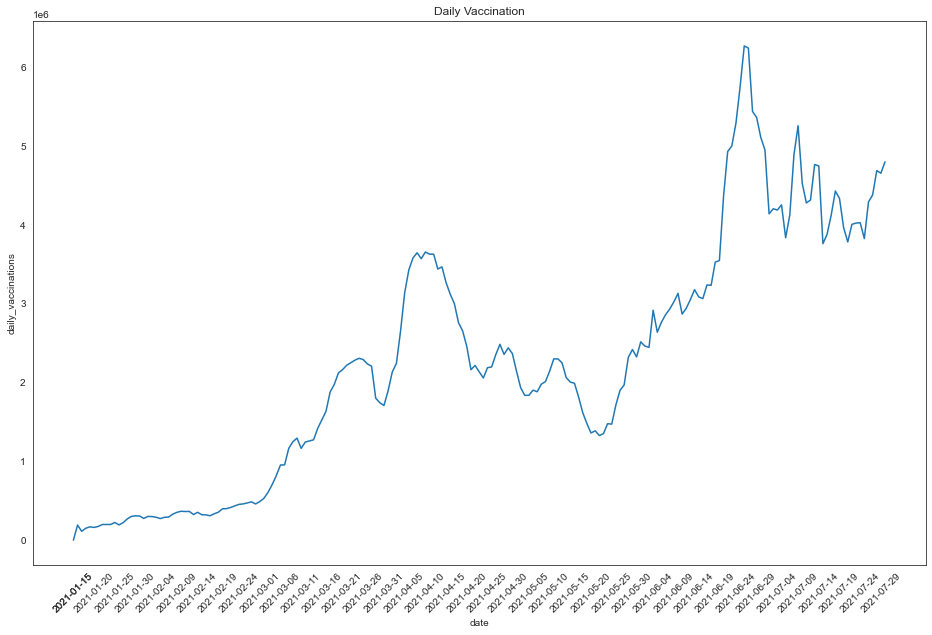

In [45]:
plt.figure(figsize=(16,10))
sns.lineplot(df.date,df.daily_vaccinations)
locs,labels=plt.xticks()
x_labels=[x for x in range(len(labels)) if x%5==0]+[0]
plt.xticks(x_labels,rotation='45')
plt.title("Daily Vaccination")

# Daily Vaccination and daily new cases using Joint plot

In [46]:
summary = vaccination[vaccination['country']=='India']
combine = pd.merge(india,summary,on="country")

<Figure size 1080x864 with 0 Axes>

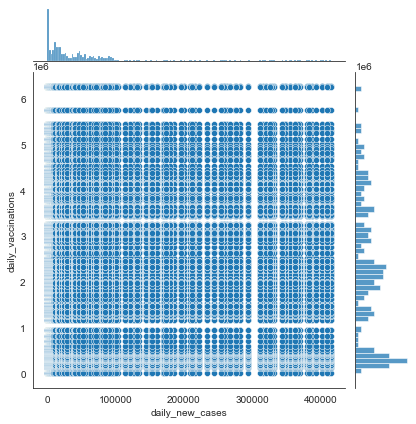

In [47]:
plt.figure(figsize=(15,12))
sns.jointplot(x="daily_new_cases",y="daily_vaccinations",data=combine)
plt.show()

# Overall summary for India Using pair plot

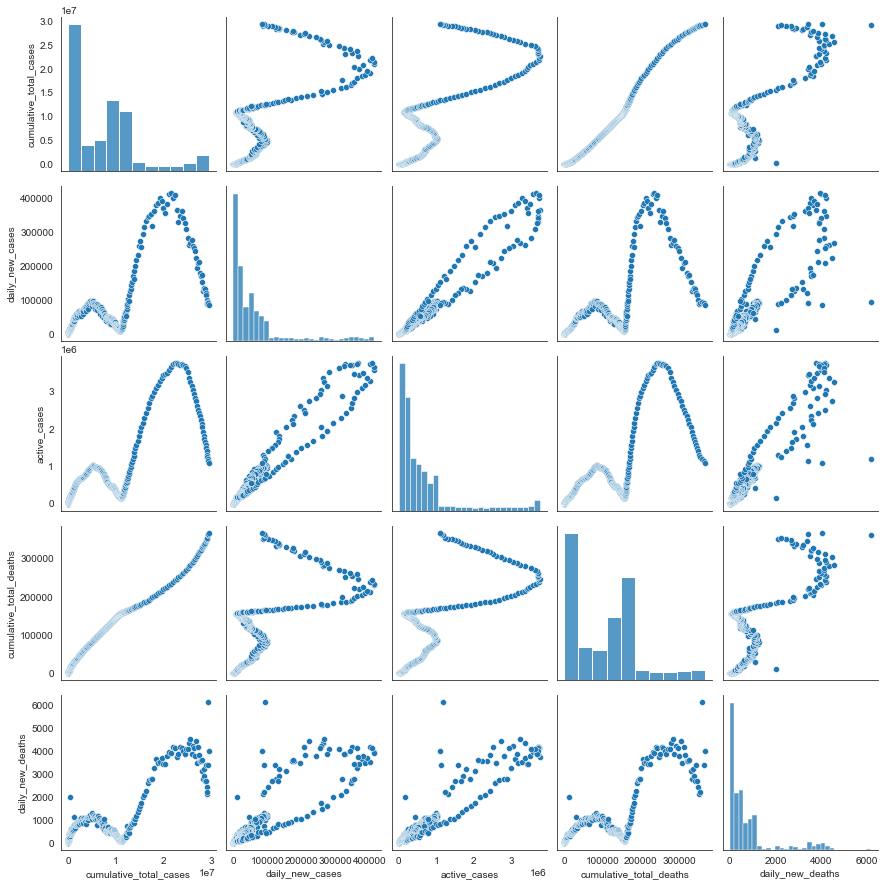

In [48]:
sns.pairplot(india)

# Analysis for Bangladesh:

# Active Cases and Daily new deaths

In [59]:
bd = daily_cases[daily_cases['country']=='Bangladesh']
fig = make_subplots(rows=2,cols=1,subplot_titles=('Active Cases','Daily New Deaths'))

fig.add_trace(go.Bar(x=bd['date'].values, y=bd['active_cases'].values,showlegend=False),
              row=1,col=1)

fig.add_trace(go.Bar(x=bd['date'].values, y=bd['daily_new_deaths'].values,showlegend=False),
              row=2,col=1)

fig.update_layout(height=800,width=700)
fig.show()

# Daily Vaccinations

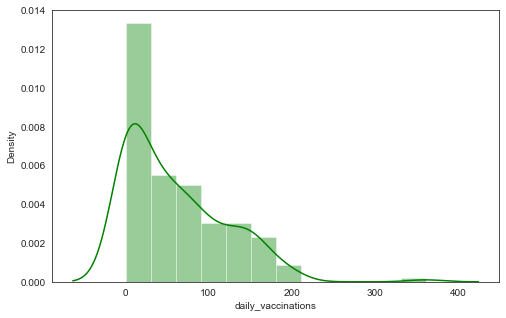

In [60]:
bdinfo = vaccination[vaccination['country']=='Bangladesh']
plt.figure(figsize=(8,5))

sns.distplot(bdinfo.daily_vaccinations/1000,kde=True,color='green')
plt.xlabel=('Daily Vaccinations(x1000)')

Text(0.5, 1.0, 'Daily Vaccination')

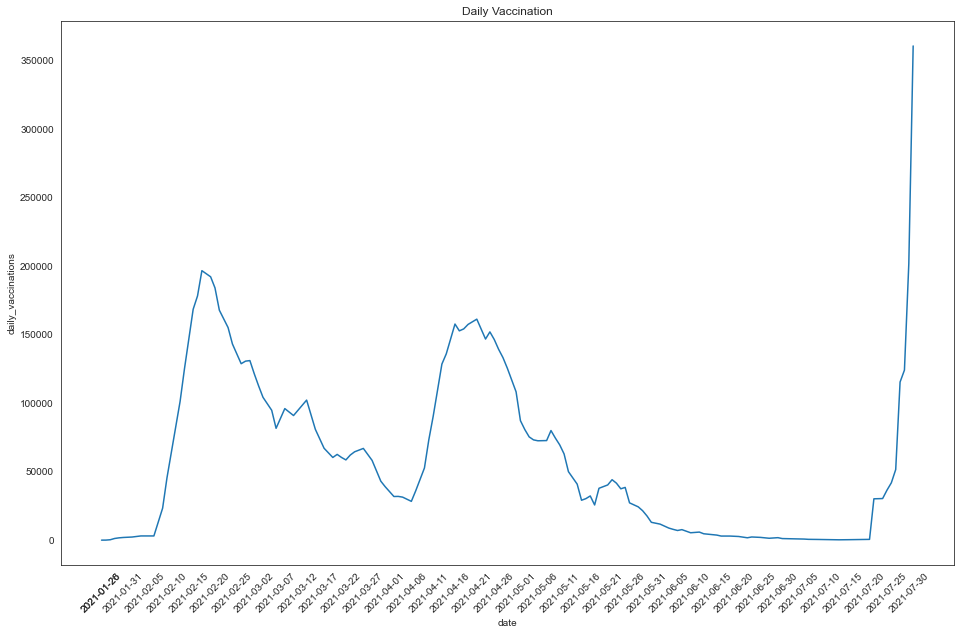

In [61]:
plt.figure(figsize=(16,10))
sns.lineplot(bdinfo.date,bdinfo.daily_vaccinations)
locs,labels=plt.xticks()
x_labels=[x for x in range(len(labels)) if x%5==0]+[0]
plt.xticks(x_labels,rotation='45')
plt.title("Daily Vaccination")

# Daily Vaccination and daily new cases using Joint plot

In [62]:
summary = vaccination[vaccination['country']=='Bangladesh']
combine = pd.merge(bd,summary,on="country")

<Figure size 1080x864 with 0 Axes>

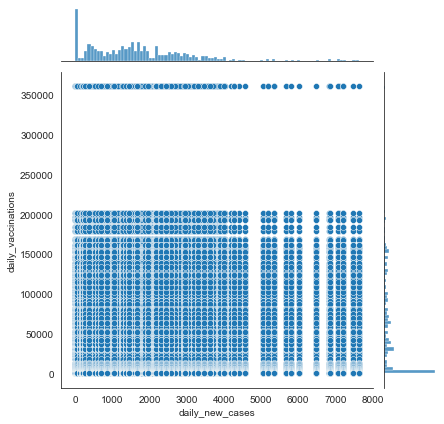

In [63]:
plt.figure(figsize=(15,12))
sns.jointplot(x="daily_new_cases",y="daily_vaccinations",data=combine)
plt.show()

# Overall summary for Bangladesh Using pair plot

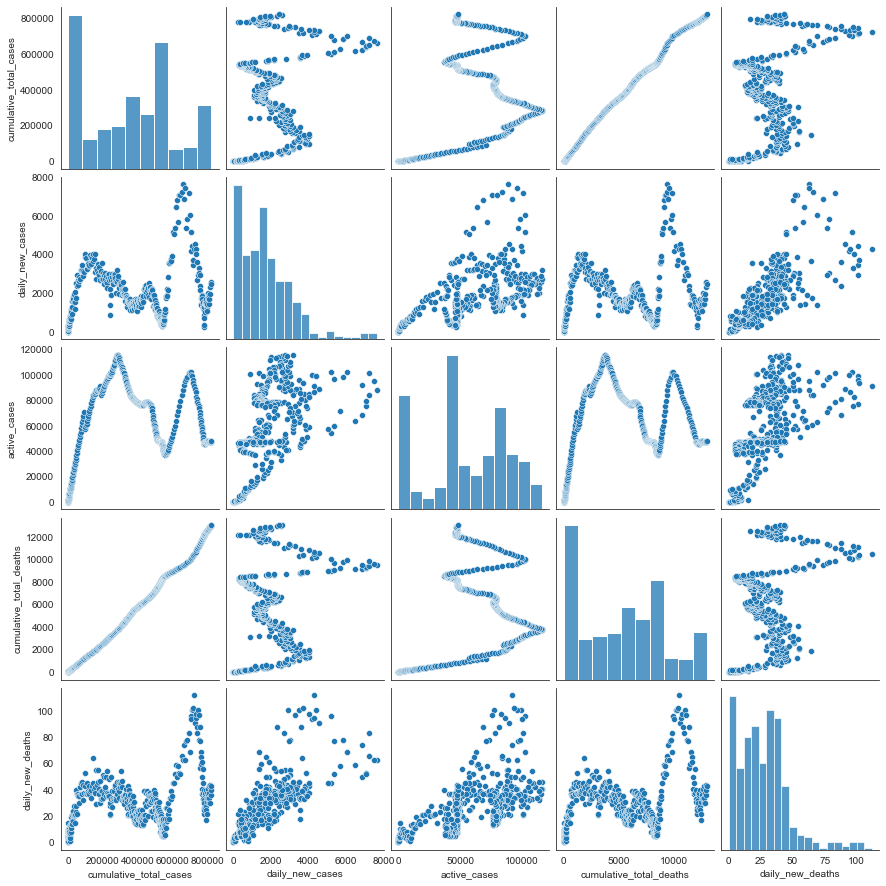

In [64]:
sns.pairplot(bd)